## Load model

In [1]:
import pickle
folder = "../workin_on_nov_20/"
model_name = folder+"MODEL_70_Random_Forest_1x1_only_sa_npy.sav"
loaded_model = pickle.load(open(model_name, 'rb'))
print(loaded_model)

RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
           max_features='auto', max_leaf_nodes=None,
           min_impurity_decrease=0.0, min_impurity_split=None,
           min_samples_leaf=1, min_samples_split=2,
           min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
           oob_score=False, random_state=None, verbose=0, warm_start=False)


In [2]:
from sklearn.ensemble import RandomForestRegressor
import numpy as np

import matplotlib.pyplot as plt; 
import pandas as pd
plt.rcdefaults()
%matplotlib inline

import PIL
import glob
import scikitplot as skplt

In [3]:
folder = "../satyam_rad_sat_mod_npy/"
Sa1_files = glob.glob("../satyam_rad_sat_mod_npy/sa1_npy_removed/*15.npy")
Sa1_files += glob.glob("../satyam_rad_sat_mod_npy/sa1_npy_removed/*21.npy")
Sa1_files

['../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017010215.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017022315.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017012115.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017022415.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017022515.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017022815.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017012215.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017030115.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017020715.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017030615.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017021415.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017031415.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017032115.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017040215.npy',
 '../satyam_rad_sat_mod_npy/sa1_npy_removed/sat.2017040315.npy',
 '../satyam_rad_sat_mod_n

In [4]:
X_input = []
input_names = ["Band 1", "Band 2", "Band 3", "Band 4", "Band 6"]
X_names = np.asarray(input_names)

Y_output = []

In [5]:
len(Sa1_files)

153

In [6]:
count = 0

In [7]:
for filename in Sa1_files:
    filename = filename.split('/')[-1]
    
    # Satellite 1
    Sa_1_File = folder + "sa1_npy_removed/" + filename;
    Sa1arr = np.load(Sa_1_File).flatten()
    
    # Satellite 2
    Sa_2_File = folder + "sa2_npy/" + filename;
    Sa2arr = np.load(Sa_2_File).flatten()
    
    # Satellite 3
    Sa_3_File = folder + "sa3_npy/" + filename;
    Sa3arr = np.load(Sa_3_File).flatten()
    
    # Satellite 4
    Sa_4_File = folder + "sa4_npy/" + filename;
    Sa4arr = np.load(Sa_4_File).flatten()
    
    # Satellite 6
    Sa_6_File = folder + "sa6_npy/" + filename;
    Sa6arr = np.load(Sa_6_File).flatten()
    
    
    # Radar
    Radar_File = folder + "rad_npy/" + filename.replace('sat', "rad", 1)
    Radararr = np.load(Radar_File).flatten()
    
    for i in range(len(Sa1arr)):
        x = [];
        x.append(Sa1arr[i])
        x.append(Sa2arr[i])
        x.append(Sa3arr[i])
        x.append(Sa4arr[i])
        x.append(Sa6arr[i])
        
        Y_output.append(Radararr[i])
        
        X_input.append(x)
    count += 1;
    #if(count == 150):
    #    break

In [8]:
X_input = np.array(X_input)
Y_output = np.array(Y_output)

In [9]:
X_input.shape

(10027008, 5)

In [10]:
X_input[:, 4].shape

(10027008,)

In [11]:
X_input[:, 4]

array([13484.078 , 13466.634 , 13501.077 , ...,  6859.85  ,  6962.921 ,
        6985.3447], dtype=float32)

In [12]:
X_input[:, 4][1:4]

array([13466.634, 13501.077, 13529.942], dtype=float32)

In [13]:
Y_output.shape

(10027008,)

## Visualize

In [14]:
def plotgraph(i):
    fig=plt.figure()
    
    X_sa1 = X_input[:, 0][(i*65536):((i+1)*65536)].reshape((256, 256))
    fig.add_subplot(1, 5, 1)
    plt.imshow(X_sa1, cmap="gray")
    
    X_sa2 = X_input[:, 1][(i*65536):((i+1)*65536)].reshape((256, 256))
    fig.add_subplot(1, 5, 2)
    plt.imshow(X_sa2, cmap="gray")

    X_sa3 = X_input[:, 2][(i*65536):((i+1)*65536)].reshape((256, 256))
    fig.add_subplot(1, 5, 3)
    plt.imshow(X_sa3, cmap="gray")
    
    
    X_sa4 = X_input[:, 3][(i*65536):((i+1)*65536)].reshape((256, 256))
    fig.add_subplot(1, 5, 4)
    plt.imshow(X_sa4, cmap="gray")
    
    X_sa6 = X_input[:, 4][(i*65536):((i+1)*65536)].reshape((256, 256))
    fig.add_subplot(1, 5, 5)
    plt.imshow(X_sa6, cmap="gray")
    
    plt.show()
    
    fig_=plt.figure()
    
    Y_test_predicted = loaded_model.predict(X_input)[(i*65536):((i+1)*65536)].reshape((256, 256))
    fig_.add_subplot(1, 2, 1)
    plt.imshow(Y_test_predicted, cmap="gray")
    
    Y_true = Y_output[(i*65536):((i+1)*65536)].reshape((256, 256))
    fig_.add_subplot(1, 2, 2)
    plt.imshow(Y_true, cmap="gray")
    
    plt.show()
    print("=====================================")

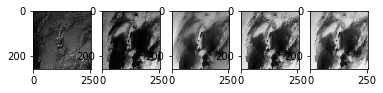

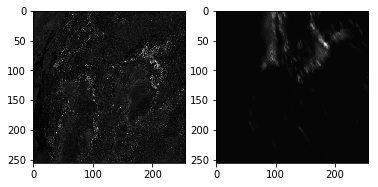

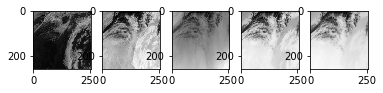

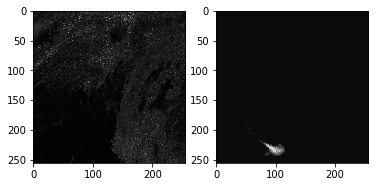

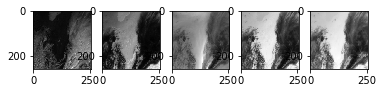

...

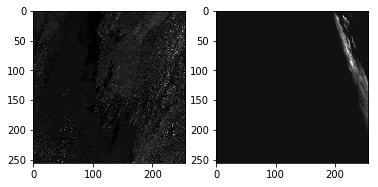

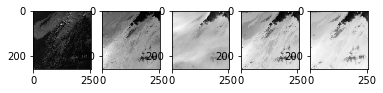

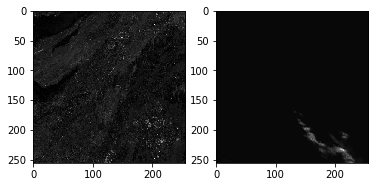

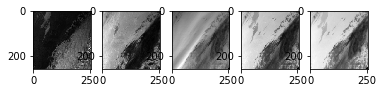

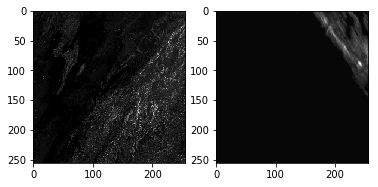

In [15]:
for i in range(153):
    plotgraph(i)